In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
import scarches
from scarches.dataset import remove_sparsity
from lataq.models import EMBEDCVAE, TRANVAE

sc.settings.set_figure_params(dpi=600, frameon=False)
sc.set_figure_params(dpi=600)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

def set_axis_style(ax, labels):
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(labels) + 1))
    ax.set_xticklabels(labels)
    ax.set_xlim(0.25, len(labels) + 0.75)
    ax.set_xlabel('Sample name')
    
%load_ext autoreload
%autoreload 2

Global seed set to 0


In [2]:
scib_lataq = pd.read_pickle('hlca_core_amir_lataq_scib_.pickle')
scib_scanvi = pd.read_pickle('hlca_core_scanvi_sample_scib.pickle')

In [3]:
map_metrics = {
    'NMI_cluster/label': 'bio conservation', 
    'ARI_cluster/label': 'bio conservation',
    'ASW_label': 'bio conservation', 
    'ASW_label/batch': 'batch correction', 
    'PCR_batch': 'batch correction',
    'isolated_label_F1': 'bio conservation', 
    'isolated_label_silhouette': 'bio conservation',
    'graph_conn': 'batch correction',
}
scib_lataq['bio_conservation'] = scib_lataq[[
    'NMI_cluster/label', 
    'ARI_cluster/label',
    'ASW_label', 
    'isolated_label_F1',
    'isolated_label_silhouette',
]].mean(axis=1)
scib_scanvi['bio_conservation'] = scib_scanvi[[
    'NMI_cluster/label', 
    'ARI_cluster/label',
    'ASW_label', 
    'isolated_label_F1',
    'isolated_label_silhouette',
]].mean(axis=1)
scib_lataq['batch_correction'] = scib_lataq[[
    'ASW_label/batch', 
    'PCR_batch',
    'graph_conn', 
]].mean(axis=1)
scib_scanvi['batch_correction'] = scib_scanvi[[
    'ASW_label/batch', 
    'PCR_batch',
    'graph_conn',
]].mean(axis=1)
scib_lataq['mean_score'] = 0.4*scib_lataq['batch_correction'] + 0.6*scib_lataq['bio_conservation']
scib_scanvi['mean_score'] = 0.4*scib_scanvi['batch_correction'] + 0.6*scib_scanvi['bio_conservation']

In [4]:
scib_lataq = scib_lataq.assign(model='scPoli')
scib_scanvi = scib_scanvi.assign(model='scANVI')
scib = pd.concat([scib_lataq, scib_scanvi])
d = pd.melt(scib[['mean_score', 'bio_conservation', 'batch_correction', 'model']], id_vars='model')

In [5]:
palette_dict = {
    'scPoli': '#6b00b3',
    'scANVI': '#85C1E9',
}

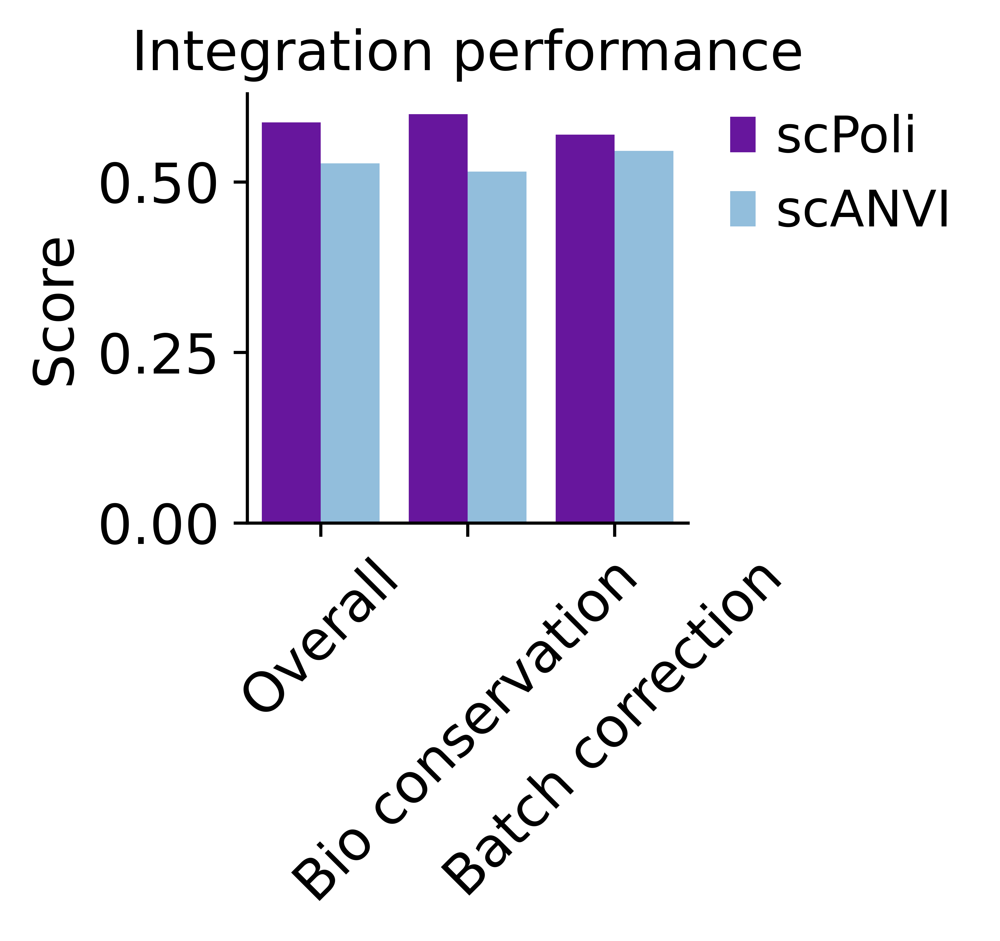

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(2, 2))
sns.barplot(x='variable', hue='model', y='value', palette=palette_dict, data=d, ax=ax)
ax.set_xticklabels(['Overall', 'Bio conservation', 'Batch correction'], rotation=45)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
ax.set_xlabel('')
ax.set_ylabel('Score')
ax.grid(False)
ax.set_title('Integration performance')
sns.despine()
fig.savefig('figure_hlca/integration_performance.png', dpi=500, bbox_inches='tight')

In [2]:
adata = sc.read('hlca_core_amir_integrated.h5ad')

In [5]:
len(adata.obs['sample'].unique())

166

In [7]:
len(adata.obs['subject_ID'].unique())

107

In [8]:
adata_raw = sc.read('../data/hlca_counts_commonvars.h5ad')
adata.obs = adata_raw.obs

adata.obs['ann_finest_level'] = (
    adata
    .obs['ann_finest_level']
    .cat
    .reorder_categories(
        np.sort(adata.obs['ann_finest_level'].cat.categories)
    )
)

adata.obs['study'] = adata.obs['study'].apply(lambda x: x.replace('_', ''))
adata.obs['sample_type'] = adata.obs['sample_type'].apply(lambda x: x.replace('_', ' '))
adata.obs['subject_type'] = adata.obs['subject_type'].apply(lambda x: x.replace('_', ' '))

In [9]:
len(adata.obs.groupby('sample').first())

166

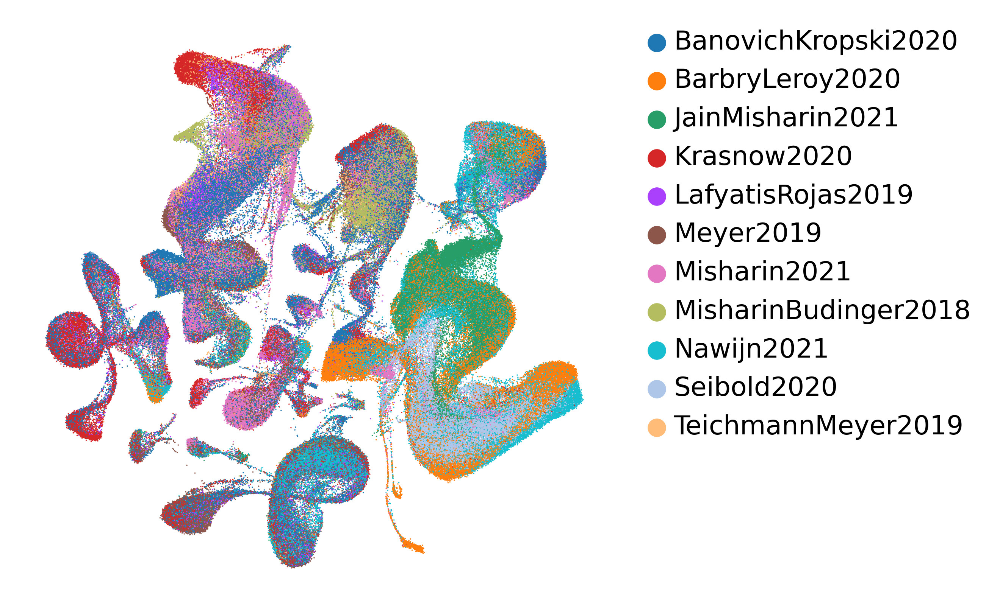

In [54]:
plt.rcParams['figure.dpi'] = 250
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata, color='study', frameon=False, size=1, show=False, ax=ax)
ax.set_title('', fontsize=18)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, ncol=1, fontsize=10, borderaxespad=0., frameon=False)
fig.savefig('figure_hlca/integrated_reference_study.png', dpi=500, bbox_inches='tight')

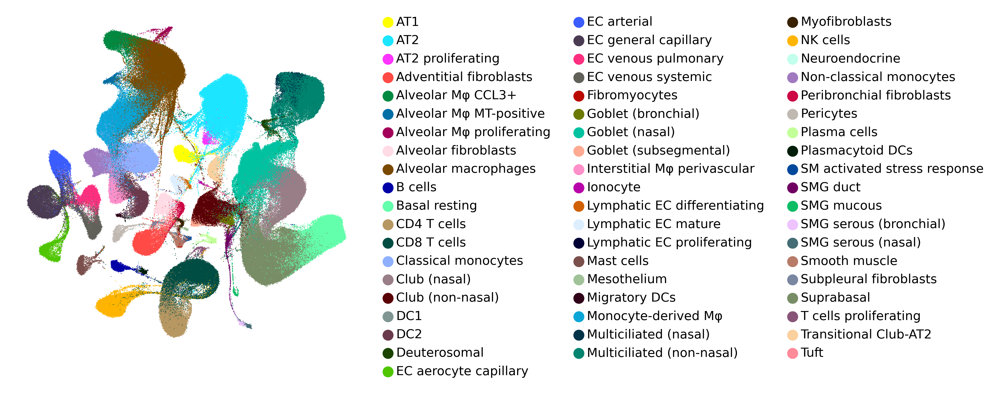

In [55]:
plt.rcParams['figure.dpi'] = 250
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata, color='ann_finest_level', frameon=False, size=1, show=False, ax=ax)
ax.set_title('', fontsize=18)
ax.legend(title='', bbox_to_anchor=(1.05, 1), loc=2, ncol=3, fontsize=8,  borderaxespad=0., frameon=False)
fig.savefig('figure_hlca/integrated_reference_celltype_highres.png', dpi=500, bbox_inches='tight')

In [18]:
adata_ref = sc.read(
    '../data/hlca_counts_commonvars.h5ad'
)
lataq = EMBEDCVAE.load('../notebooks/hlca_core_amir/hlca_core_sample/', adata_ref)

AnnData object with n_obs × n_vars = 584884 × 1897
    obs: 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'sample', 'study', 'subject_ID', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_

In [43]:
from sklearn.linear_model import LinearRegression
import scipy 
def pc_regression(
    emb_pca, covariate, pca_var=None, components=[0, 1]
):
    # fit linear model for n_comps PCs
    covariate = pd.get_dummies(covariate)
    r2 = []
    for i in components:
        pc = emb_pca[:, [i]]
        lm = LinearRegression()
        lm.fit(covariate, pc)
        r2_score = lm.score(covariate, pc)
        #r2_score, _ = scipy.stats.pearsonr(covariate, pc)
        r2.append(r2_score**2)

    Var = pca_var[components] / sum(pca_var[components]) * 100
    R2Var = sum(r2 * Var) / 100

    return R2Var

def embedding_plot(
    lataq_model, 
    condition_key,
    emb_pca, 
    adata,
    components,
    key, 
    title=None
):
    cond = (
        adata
        .obs
        .groupby(condition_key)
        .first()
        .reindex(lataq_model.conditions_)
        [key]
    )
    patient_id = lataq_model.conditions_
    r2var = pc_regression(emb_pca, cond, pca.explained_variance_, components)
    print(r2var)
    #fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    import seaborn as sns
    plt.rcParams['figure.figsize'] = (4, 4)
    pgrid = sns.jointplot(
        emb_pca[:, components[0]], 
        emb_pca[:, components[1]], 
        hue=cond,
        height=4,
        #hue_order = cond_to_keep,
        #palette = 'Reds',
        #ax=ax
        marginal_kws={'common_norm': True, 'clip': [-0.75, 0.75]},
    )
    #for i in range(emb_pca.shape[0]):
    #    ax.text(
    #        x=emb_pca[i, components[0]]+0.01,
    #        y=emb_pca[i, components[1]]+0.01,
    #        s=patient_id[i],
    #        fontsize=5
    #    )
    #pgrid.ax_joint.text(0.4, 0.7, f'$R^{2} Var: {r2var:.2f}$', fontsize=12)
    pgrid.ax_joint.grid(False)
    pgrid.ax_marg_x.grid(False)
    pgrid.ax_marg_y.grid(False)
    pgrid.ax_marg_x.set_title(title, fontsize=25)
    pgrid.ax_joint.set_xlabel(f'PC{components[0]+1}', fontweight='bold', fontsize=12)
    pgrid.ax_joint.set_ylabel(f'PC{components[1]+1}', fontweight='bold', fontsize=12)
    pgrid.ax_joint.legend(bbox_to_anchor=(1.25, 1), loc=2, fontsize=12, frameon=False, borderaxespad=0.)
    sns.despine()
    #fig = pgrid.get_figure()
    pgrid.savefig(f'figure_hlca/sample_embeddings_{key}_{components[0]}.png', dpi=500, bbox_inches='tight')

In [44]:
from sklearn.decomposition import PCA
embedding = lataq.model.embedding.weight.detach().cpu().numpy()
pca = PCA(n_components=5)
emb_pca = pca.fit_transform(embedding)


0.6652224079817088


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


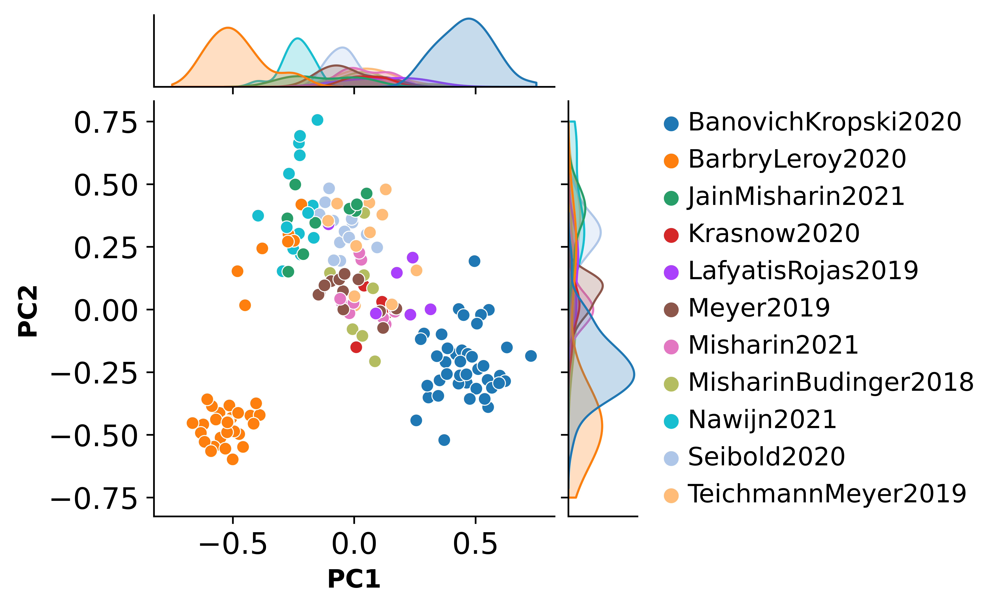

In [45]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'study',)

0.4952795053396777


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


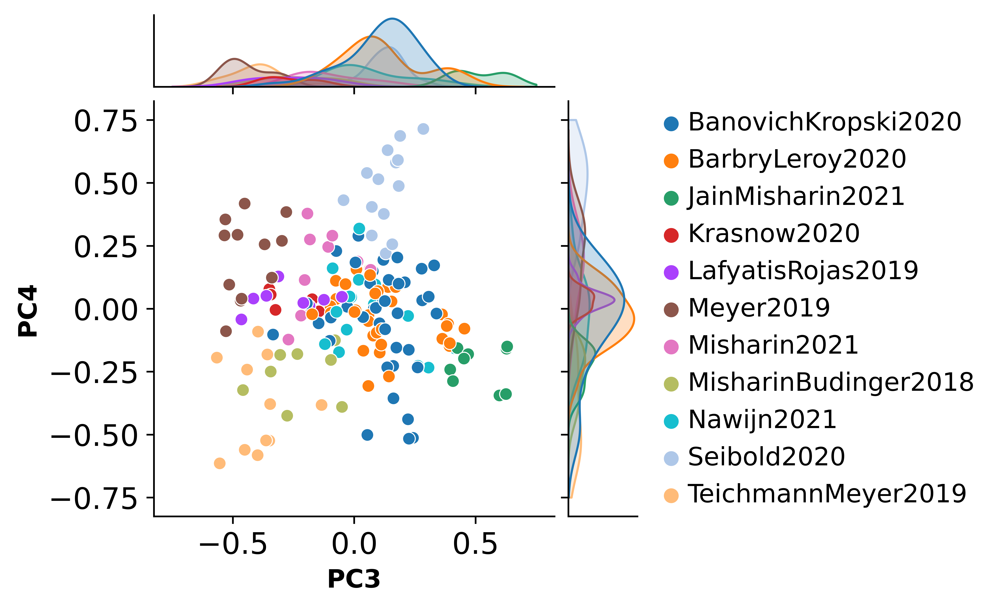

In [46]:
embedding_plot(lataq, 'sample', emb_pca, adata, [2, 3], 'study',)

0.21526845745312467


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedon

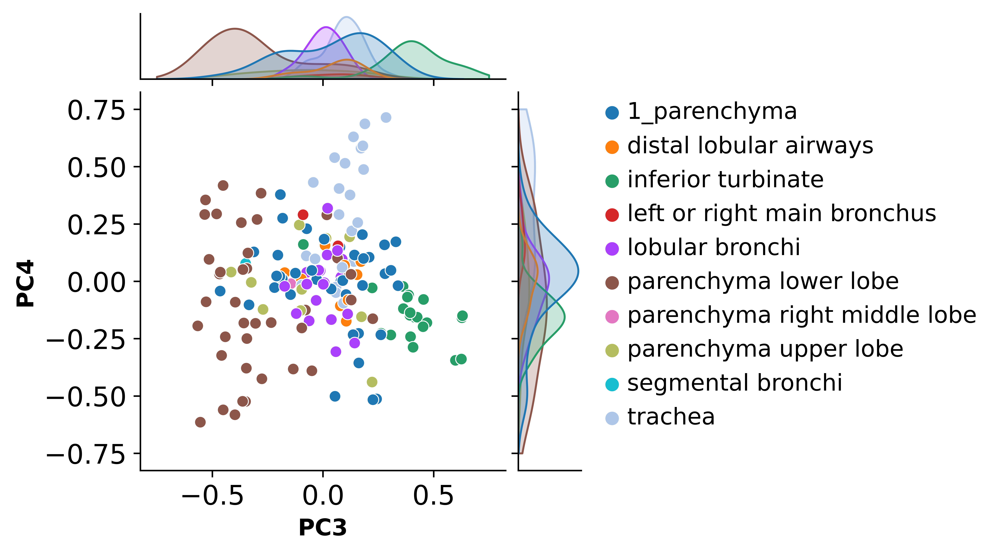

In [47]:
embedding_plot(lataq, 'sample', emb_pca, adata, [2, 3], 'anatomical_region_level_2',)

0.19194401889219384


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


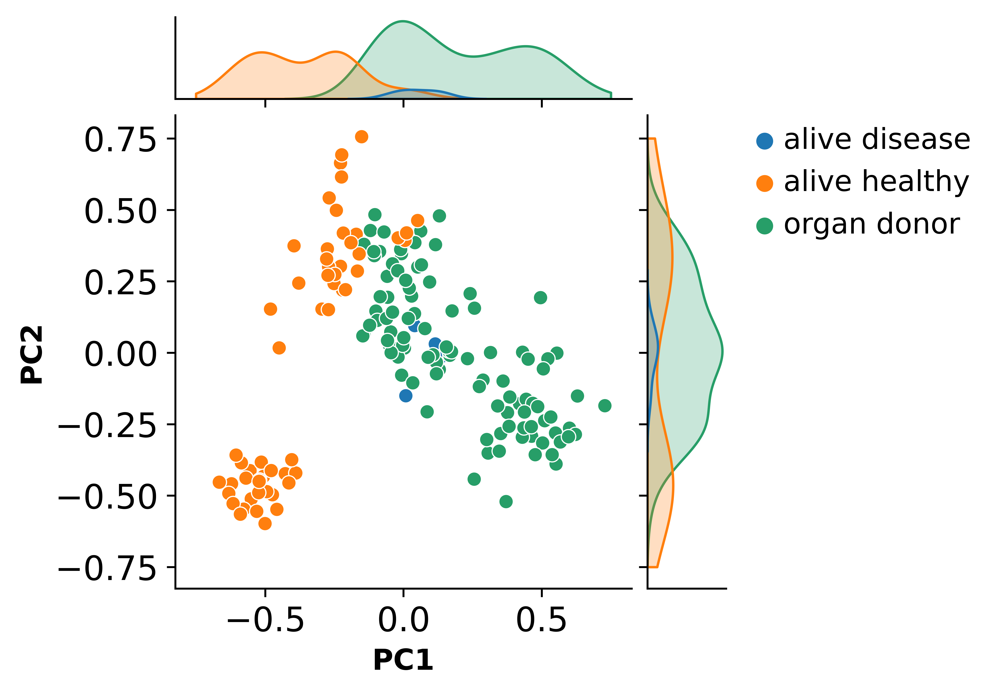

In [48]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'subject_type')

0.4146858633926873


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedon

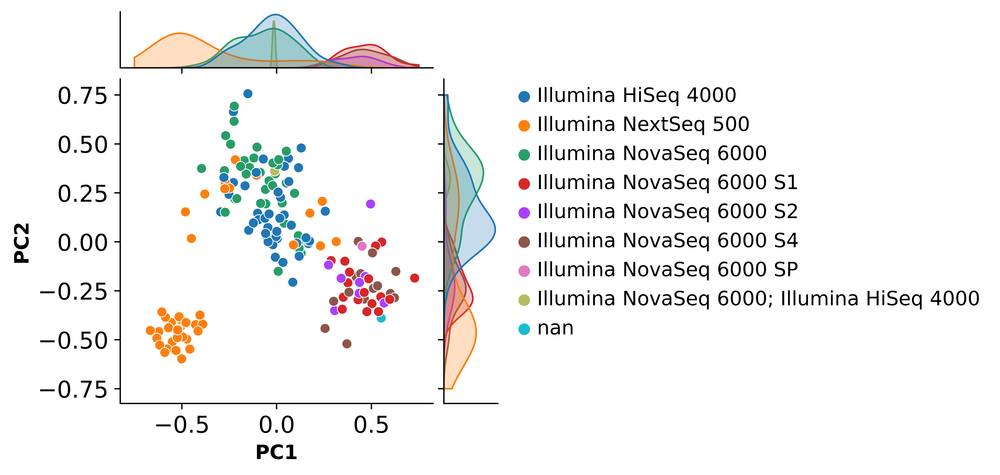

In [49]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'sequencing_platform',)

0.2245554108165792


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


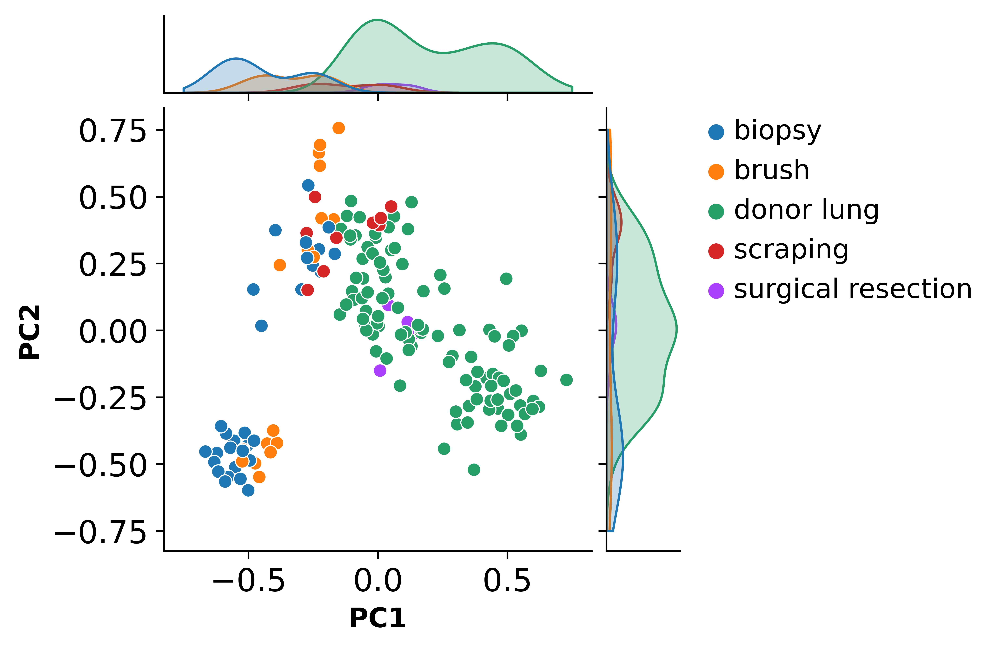

In [50]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'sample_type')

0.1767531940760632


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


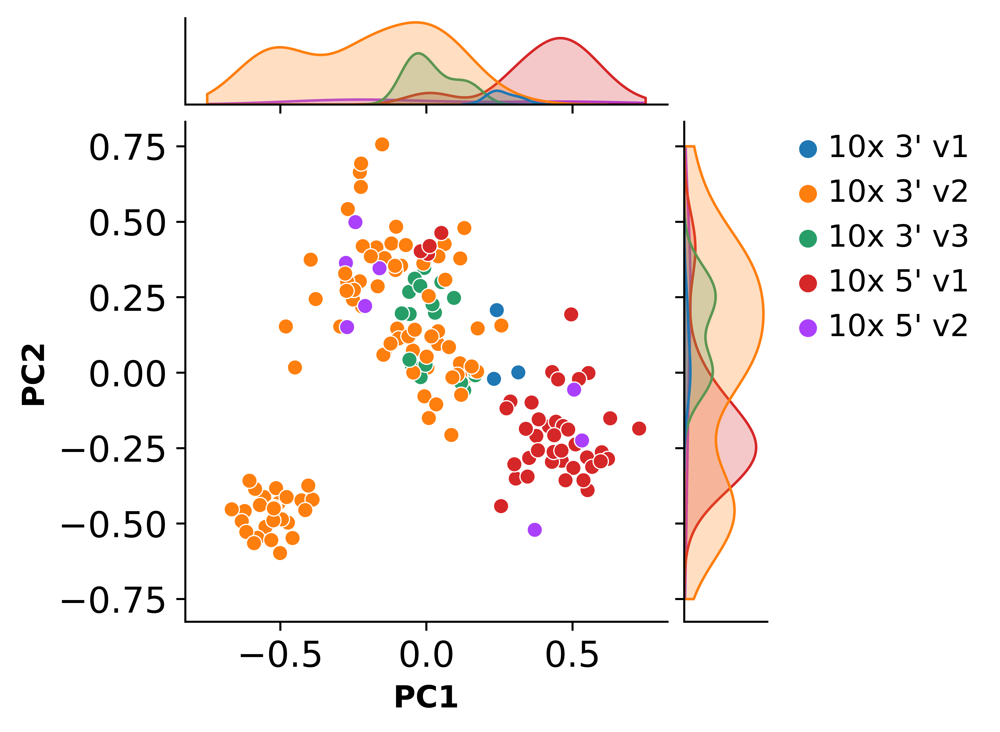

In [51]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'assay',)

0.0011335073058812667


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


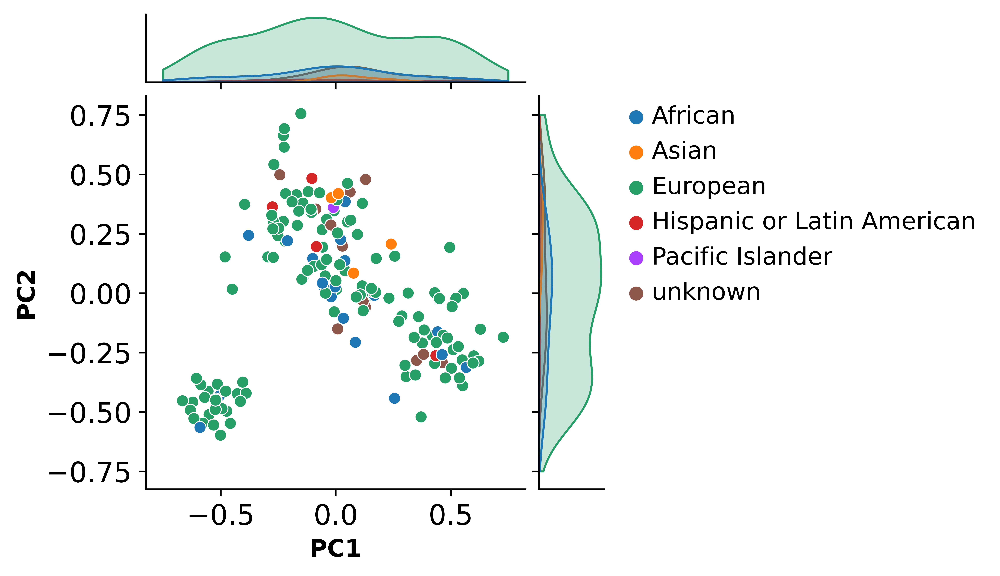

In [52]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'ethnicity',)

0.0017359608971512514


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


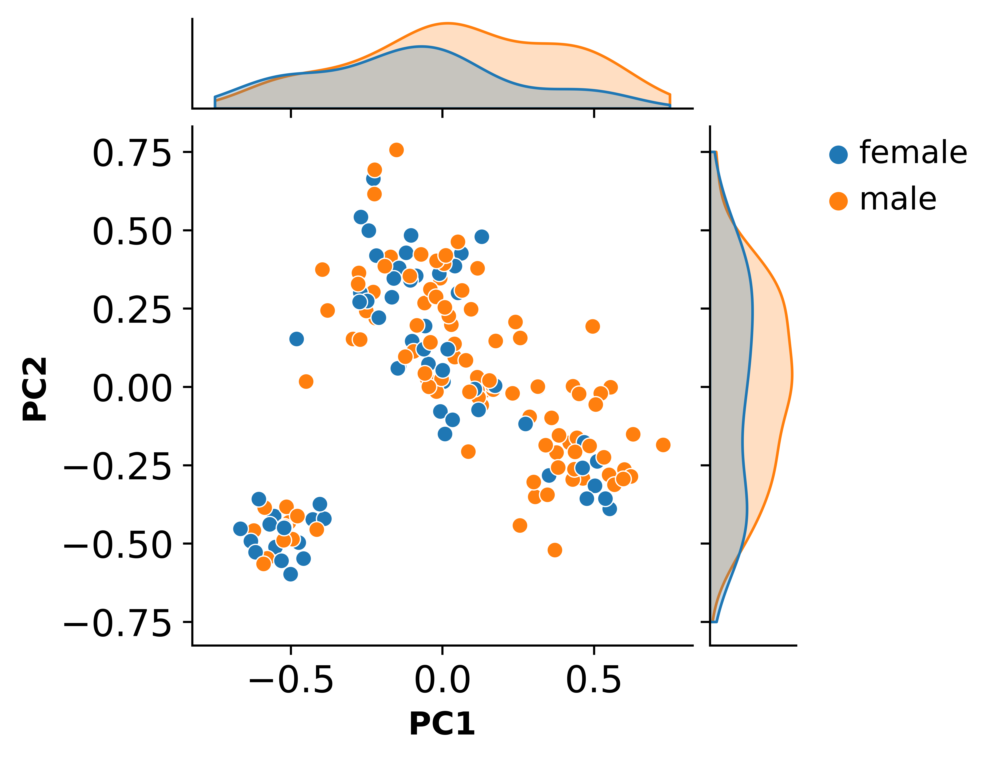

In [53]:
embedding_plot(lataq, 'sample', emb_pca, adata, [0, 1], 'sex',)